## STEPS
- Data collection
- understanding of data
- data cleaning
- loading of training set
- data preprocessing -- images
- data preprocessing -- captions
- word embeddings
- model architecture
- evaluation

In [153]:
# import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import keras
import re
import nltk
from nltk.corpus import stopwords
import string
import json
from time import time
import pickle
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Input, Dense, Dropout, Embedding, LSTM, add

# Read Captions File

In [3]:
# Reading the Description file

with open(r"G:\Study extra\Research\2. Project-1 Image Caption Bot\Image Caption Bot Project code\Flickr_Data\Flickr_Data\Flickr_Data\Flickr_TextData\Flickr8k.token.txt") as filepath:
    captions = filepath.read()
    filepath.close()

In [4]:
captions = captions.split("\n")[:-1]

In [5]:
len(captions)

40460

In [6]:
# creating a "descriptions" dictionary  where key is 'img_name' and value is list of captions corresponding to that image_file.

descriptions = {}

for ele in captions:
    i_to_c = ele.split("\t")
    img_name = i_to_c[0].split(".")[0]
    cap = i_to_c[1]
    
    if descriptions.get(img_name) == None:
        descriptions[img_name] = []

    descriptions[img_name].append(cap)

In [7]:
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

# Data Cleaning

In [8]:
""" 1. lower each word
    2. remove puntuations
    3. remove words less than length 1 """ 

def clean_text(sample):
    sample = sample.lower()
    
    sample = re.sub("[^a-z]+"," ",sample)
    
    sample = sample.split()
    
    sample = [s for s in sample if len(s)>1]
    
    sample = " ".join(sample)
    
    return sample

In [9]:
clean_text("My noghsujf si am m cricket101 &8 mphi*&86%%&??,BYs6fajdn 213 q rqu243 boy  32 ewr wO>>J DHD 34  asfb HHGY Gvg HgB   231 123")

'my noghsujf si am cricket mphi bys fajdn rqu boy ewr wo dhd asfb hhgy gvg hgb'

In [10]:
#  modify all the captions i.e - cleaned captions

for key, desc_list in descriptions.items():
    for i in range(len(desc_list)):
        desc_list[i] = clean_text(desc_list[i])

In [11]:
#  clean descriptions

descriptions['1000268201_693b08cb0e']

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

In [12]:
# writing clean description to .txt file

f = open("descriptions.txt","w")
f.write( str(descriptions) )
f.close()

In [13]:
#  reading description file

f = open("descriptions.txt", 'r')
descriptions = f.read()
f.close()

json_acceptable_string = descriptions.replace("'", "\"")
descriptions = json.loads(json_acceptable_string)

In [14]:
# finding the unique vocabulary 

vocabulary = set()

for key in descriptions.keys():
    [vocabulary.update(i.split()) for i in descriptions[key]]

print('Vocabulary Size: %d' % len(vocabulary))

Vocabulary Size: 8424


In [15]:
#  ALl words in description dictionary
all_vocab =  []

for key in descriptions.keys():
    [all_vocab.append(i) for des in descriptions[key] for i in des.split()]

print('Vocabulary Size: %d' % len(all_vocab))
print(all_vocab[:15])

Vocabulary Size: 373837
['child', 'in', 'pink', 'dress', 'is', 'climbing', 'up', 'set', 'of', 'stairs', 'in', 'an', 'entry', 'way', 'girl']


In [16]:
#  count the frequency of each word, sort them and discard the words having frequency lesser than threshold value

import collections


counter= collections.Counter(all_vocab)

dic_ = dict(counter)

threshelod_value = 10

sorted_dic = sorted(dic_.items(), reverse=True, key = lambda x: x[1])
sorted_dic = [x for x in sorted_dic if x[1]>threshelod_value]
all_vocab = [x[0] for x in sorted_dic]

In [17]:
len(all_vocab)

1845

# Loading Training Testing Data

In [19]:
# TrainImagesFile
f = open(r"G:\Study extra\Research\2. Project-1 Image Caption Bot\Image Caption Bot Project code\1 Flickr_TextData, Text files\Flickr_TextData\Flickr_8k.trainImages.txt")
train = f.read()
f.close()

In [20]:
train  = [e.split(".")[0] for e in train.split("\n")[:-1]]

In [21]:
# TestImagesFile
f = open(r"G:\Study extra\Research\2. Project-1 Image Caption Bot\Image Caption Bot Project code\1 Flickr_TextData, Text files\Flickr_TextData\Flickr_8k.testImages.txt")
test = f.read()
f.close()

In [22]:
test  = [e.split(".")[0] for e in test.split("\n")[:-1]]

In [23]:
# create train_descriptions dictionary, which will be similar to earlier one, but having only train samples
# add startseq + endseq 

train_descriptions = {}

for t in train:
    train_descriptions[t] = []
    for cap in descriptions[t]:
        cap_to_append = "startseq " + cap + " endseq"
        train_descriptions[t].append(cap_to_append)

In [24]:
train_descriptions['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

# Data Preprocessing - Images

In [25]:
"""
In this section, we will load our images and do some processing so that we can feed it in our network.
"""

'\nIn this section, we will load our images and do some processing so that we can feed it in our network.\n'

In [26]:
model = ResNet50(weights="imagenet", input_shape=(224,224,3))

In [27]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 7, 7, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 7, 7, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 7, 7, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [28]:
# Create a new model, by removing the last layer (output layer of 1000 classes) from the resnet50
model_new = Model(model.input, model.layers[-2].output)

In [65]:
images = "Images"

In [66]:
def preprocess_image(img):
    img = image.load_img(img, target_size=(224,224))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

In [67]:
def encode_image(img):
    img = preprocess_image(img)
    feature_vector = model_new.predict(img)
    feature_vector = feature_vector.reshape(feature_vector.shape[1],)
    return feature_vector

In [68]:
start = time()

encoding_train = {}

for ix, img in enumerate(train):
    
    img = "Images/{}.jpg".format(train[ix])
    encoding_train[img[len(images):]] = encode_image(img)
    
    if ix%100==0:
        print("Encoding image- "+ str(ix))
    
print("Time taken in seconds =", time()-start)

1/1 [==============================] - 4s 4s/step
Encoding image- 0
1/1 [==============================] - 0s 162ms/step
Encoding image- 100
1/1 [==============================] - 0s 175ms/step


1/1 [==============================] - 0s 139ms/step
Encoding image- 200
1/1 [==============================] - 0s 172ms/step
Encoding image- 300
1/1 [==============================] - 0s 144ms/step


1/1 [==============================] - 0s 145ms/step
Encoding image- 400
1/1 [==============================] - 0s 197ms/step


1/1 [==============================] - 0s 170ms/step
Encoding image- 500
1/1 [==============================] - 0s 190ms/step
Encoding image- 600
1/1 [==============================] - 0s 167ms/step


1/1 [==============================] - 0s 291ms/step
Encoding image- 700
1/1 [==============================] - 0s 220ms/step


1/1 [==============================] - 0s 190ms/step
Encoding image- 800
1/1 [==============================] - 0s 196ms/step
Encoding image- 900
1/1 [==============================] - 0s 193ms/step


1/1 [==============================] - 0s 166ms/step
Encoding image- 1000
1/1 [==============================] - 0s 161ms/step


1/1 [==============================] - 0s 147ms/step
Encoding image- 1100
1/1 [==============================] - 0s 174ms/step
Encoding image- 1200
1/1 [==============================] - 0s 187ms/step


1/1 [==============================] - 0s 164ms/step
Encoding image- 1300
1/1 [==============================] - 0s 157ms/step


1/1 [==============================] - 0s 174ms/step
Encoding image- 1400
1/1 [==============================] - 0s 244ms/step
Encoding image- 1500
1/1 [==============================] - 0s 173ms/step


1/1 [==============================] - 0s 160ms/step
Encoding image- 1600
1/1 [==============================] - 0s 190ms/step


1/1 [==============================] - 0s 171ms/step
Encoding image- 1700
1/1 [==============================] - 0s 237ms/step
Encoding image- 1800
1/1 [==============================] - 0s 159ms/step


1/1 [==============================] - 0s 165ms/step
Encoding image- 1900
1/1 [==============================] - 0s 185ms/step


1/1 [==============================] - 0s 184ms/step
Encoding image- 2000
1/1 [==============================] - 0s 159ms/step
Encoding image- 2100
1/1 [==============================] - 0s 172ms/step


1/1 [==============================] - 0s 188ms/step
Encoding image- 2200
1/1 [==============================] - 0s 166ms/step
Encoding image- 2300
1/1 [==============================] - 0s 180ms/step


1/1 [==============================] - 0s 380ms/step
Encoding image- 2400
1/1 [==============================] - 0s 190ms/step


1/1 [==============================] - 0s 166ms/step
Encoding image- 2500
1/1 [==============================] - 0s 192ms/step
Encoding image- 2600
1/1 [==============================] - 0s 188ms/step


1/1 [==============================] - 0s 193ms/step
Encoding image- 2700
1/1 [==============================] - 0s 165ms/step


1/1 [==============================] - 0s 186ms/step
Encoding image- 2800
1/1 [==============================] - 0s 191ms/step
Encoding image- 2900
1/1 [==============================] - 0s 202ms/step


1/1 [==============================] - 0s 206ms/step
Encoding image- 3000
1/1 [==============================] - 0s 241ms/step


1/1 [==============================] - 0s 177ms/step
Encoding image- 3100
1/1 [==============================] - 0s 195ms/step
Encoding image- 3200
1/1 [==============================] - 0s 189ms/step


1/1 [==============================] - 0s 187ms/step
Encoding image- 3300
1/1 [==============================] - 0s 328ms/step


1/1 [==============================] - 0s 230ms/step
Encoding image- 3400
1/1 [==============================] - 0s 211ms/step
Encoding image- 3500
1/1 [==============================] - 0s 200ms/step


1/1 [==============================] - 0s 199ms/step
Encoding image- 3600
1/1 [==============================] - 0s 272ms/step


1/1 [==============================] - 0s 258ms/step
Encoding image- 3700
1/1 [==============================] - 0s 214ms/step
Encoding image- 3800
1/1 [==============================] - 0s 206ms/step


1/1 [==============================] - 0s 214ms/step
Encoding image- 3900
1/1 [==============================] - 0s 260ms/step


1/1 [==============================] - 0s 246ms/step
Encoding image- 4000
1/1 [==============================] - 0s 233ms/step
Encoding image- 4100
1/1 [==============================] - 0s 219ms/step


1/1 [==============================] - 0s 240ms/step
Encoding image- 4200
1/1 [==============================] - 0s 232ms/step


1/1 [==============================] - 0s 204ms/step
Encoding image- 4300
1/1 [==============================] - 0s 377ms/step
Encoding image- 4400
1/1 [==============================] - 0s 286ms/step


1/1 [==============================] - 0s 212ms/step
Encoding image- 4500
1/1 [==============================] - 0s 213ms/step
Encoding image- 4600
1/1 [==============================] - 0s 218ms/step


1/1 [==============================] - 0s 263ms/step
Encoding image- 4700
1/1 [==============================] - 0s 243ms/step


1/1 [==============================] - 0s 245ms/step
Encoding image- 4800
1/1 [==============================] - 0s 239ms/step
Encoding image- 4900
1/1 [==============================] - 0s 249ms/step


1/1 [==============================] - 0s 262ms/step
Encoding image- 5000
1/1 [==============================] - 0s 254ms/step


1/1 [==============================] - 0s 317ms/step
Encoding image- 5100
1/1 [==============================] - 0s 254ms/step
Encoding image- 5200
1/1 [==============================] - 0s 269ms/step


1/1 [==============================] - 0s 248ms/step
Encoding image- 5300
1/1 [==============================] - 0s 250ms/step


1/1 [==============================] - 0s 255ms/step
Encoding image- 5400
1/1 [==============================] - 0s 272ms/step
Encoding image- 5500
1/1 [==============================] - 0s 262ms/step


1/1 [==============================] - 1s 533ms/step
Encoding image- 5600
1/1 [==============================] - 1s 542ms/step


1/1 [==============================] - 1s 516ms/step
Encoding image- 5700
1/1 [==============================] - 1s 514ms/step
Encoding image- 5800
1/1 [==============================] - 1s 523ms/step


1/1 [==============================] - 1s 516ms/step
Encoding image- 5900
1/1 [==============================] - 1s 973ms/step


1/1 [==============================] - 0s 495ms/step
Time taken in seconds = 2312.369421482086


In [74]:
# Save the bottleneck train features to disk

with open("encoded_train_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_train, encoded_pickle)

In [76]:
import pickle as pkl
with open("encodin_train_features.pkl","rb") as f:
    encoding_train=pkl.load(f)

In [77]:
start = time()

encoding_test = {}

for ix, img in enumerate(test):

    img = "Images/{}.jpg".format(test[ix])
    encoding_test[img[len(images):]] = encode_image(img)
    
    if ix%100==0:
        print("Encoding image- "+ str(ix))
    
print("Time taken in seconds =", time()-start)

1/1 [==============================] - 0s 328ms/step
Encoding image- 0
1/1 [==============================] - 0s 416ms/step
Encoding image- 100
1/1 [==============================] - 1s 506ms/step


1/1 [==============================] - 0s 390ms/step
Encoding image- 200
1/1 [==============================] - 0s 323ms/step
Encoding image- 300
1/1 [==============================] - 0s 316ms/step


1/1 [==============================] - 0s 323ms/step
Encoding image- 400
1/1 [==============================] - 0s 361ms/step


1/1 [==============================] - 0s 404ms/step
Encoding image- 500
1/1 [==============================] - 1s 540ms/step
Encoding image- 600
1/1 [==============================] - 0s 489ms/step


1/1 [==============================] - 0s 389ms/step
Encoding image- 700
1/1 [==============================] - 0s 354ms/step


1/1 [==============================] - 1s 629ms/step
Encoding image- 800
1/1 [==============================] - 0s 431ms/step
Encoding image- 900
1/1 [==============================] - 0s 424ms/step


1/1 [==============================] - 0s 324ms/step
Time taken in seconds = 599.3889226913452


In [78]:
# Save the bottleneck train features to disk

with open("encoded_test_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_test, encoded_pickle)

In [79]:
with open("encoded_test_features.pkl","rb") as f:
    encoding_test=pkl.load(f)

In [80]:
# Load the train images features from disk

with open("./encoded_train_images.pkl", "rb") as encoded_pickle:
    encoding_train = pickle.load(encoded_pickle)

In [81]:
# Load the test images features from disk

with open("encoded_test_features.pkl", "rb") as encoded_pickle:
    encoding_test = pickle.load(encoded_pickle)

In [82]:
encoding_test

{'3385593926_d3e9c21170': array([0.2823609 , 0.31681862, 0.04513445, ..., 0.74424076, 0.29651454,
        0.920625  ], dtype=float32),
 '2677656448_6b7e7702af': array([0.23350658, 0.05166636, 0.6242709 , ..., 0.00522089, 0.26217806,
        0.08686365], dtype=float32),
 '311146855_0b65fdb169': array([0.00912154, 0.0721353 , 0.1220707 , ..., 0.02203191, 1.1318818 ,
        0.03855684], dtype=float32),
 '1258913059_07c613f7ff': array([0.02427815, 1.2347251 , 0.07595173, ..., 0.08897065, 0.09812832,
        1.9384186 ], dtype=float32),
 '241347760_d44c8d3a01': array([0.0505117 , 6.3199897 , 0.3120082 , ..., 0.05379438, 0.01552999,
        0.02812625], dtype=float32),
 '2654514044_a70a6e2c21': array([1.7662996 , 0.03384979, 0.10334545, ..., 0.00532009, 0.6680156 ,
        0.39294165], dtype=float32),
 '2339106348_2df90aa6a9': array([0.06683154, 1.0869427 , 0.07896088, ..., 0.01411188, 0.1311434 ,
        0.09507965], dtype=float32),
 '256085101_2c2617c5d0': array([0.5742956 , 0.51020324, 0

# Data Preprocessing - Captions

In [83]:
"""
word_to_idx is mapping between each unique word in all_vocab to int value 
and idx_to_word is vice-versa
"""


ix = 1
word_to_idx = {}
idx_to_word = {}

for e in all_vocab:
    word_to_idx[e] = ix
    idx_to_word[ix] = e
    ix +=1    

In [84]:
#  need to add these 2 words as well

word_to_idx['startseq'] = 1846
word_to_idx['endseq'] = 1847

idx_to_word[1846] = 'startseq'
idx_to_word[1847] = 'endseq'

In [85]:
#  vocab_size is total vocabulary len +1 because we will append 0's as well. 

vocab_size = len(idx_to_word)+1
print(vocab_size)

1848


In [86]:
all_captions_len = []

for key in train_descriptions.keys():
    for cap in train_descriptions[key]:
        all_captions_len.append(len(cap.split()))

max_len = max(all_captions_len)
print(max_len)

35


# Data Preparation using Generator Function

In [87]:
def data_generator(train_descriptions, encoding_train, word_to_idx, max_len, num_photos_per_batch):

    X1, X2, y = [], [], []

    n=0

    while True:
        
        for key, desc_list in train_descriptions.items():
            n +=1

            photo = encoding_train[key]

            for desc in desc_list:
                
                seq = [ word_to_idx[word] for word in desc.split() if word in word_to_idx]  

                for i in range(1,len(seq)):

                    in_seq = seq[0:i]
                    out_seq = seq[i]

                    in_seq = pad_sequences([in_seq], maxlen=max_len, value=0, padding='post')[0]

                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]

                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)

            if n==num_photos_per_batch:
                u = np.array(X1)
                v = np.array(X2)
                w = np.array(y)
                yield ([u,v],w)
                X1, X2, y = [], [], []
                n=0

# Word Embedding

In [88]:
f = open("glove_6B_50d.txt", encoding='utf8')

In [89]:
embedding_index = {}

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype="float")
    
    embedding_index[word] = coefs
    
f.close()

## Converting words into vectors  Directly - (Embedding Layer Output)

In [90]:
def get_embedding_output():
    
    emb_dim = 50
    embedding_output = np.zeros((vocab_size,emb_dim))
    
    for word, idx in word_to_idx.items():
        embedding_vector = embedding_index.get(word)
        
        if embedding_vector is not None:
            embedding_output[idx] = embedding_vector
            
    return embedding_output


embedding_output = get_embedding_output()

In [91]:
embedding_output.shape

(1848, 50)

# Model Architecture

In [92]:
# image feature extractor model

input_img_fea = Input(shape=(2048,))
inp_img1 = Dropout(0.3)(input_img_fea)
inp_img2 = Dense(256, activation='relu')(inp_img1)

In [93]:
# partial caption sequence model

input_cap = Input(shape=(max_len,))
inp_cap1 = Embedding(input_dim=vocab_size, output_dim=50, mask_zero=True)(input_cap)
inp_cap2 = Dropout(0.3)(inp_cap1)
inp_cap3 = LSTM(256)(inp_cap2)

In [94]:
decoder1 = add([inp_img2 , inp_cap3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

# Merge 2 networks
model = Model(inputs=[input_img_fea, input_cap], outputs=outputs)

In [95]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 35)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 35, 50)       92400       ['input_3[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_2[0][0]']                
                                                                                            

In [96]:
model.layers[2].set_weights([embedding_output])
model.layers[2].trainable = False

In [97]:
model.compile(loss="categorical_crossentropy", optimizer="adam")

# Train Our Model

In [130]:
epochs = 1
number_pics_per_bath = 3
steps = len(train_descriptions)//number_pics_per_bath

In [131]:
for i in range(epochs):
    generator = data_generator(train_descriptions, encoding_train, word_to_idx, max_len, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('./model_weights/model_' + str(i) + '.h5')

C:\Users\Asus\AppData\Local\Temp\ipykernel_7184\259339223.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)


  92/2000 [>.............................] - ETA: 1:47:23 - loss: 2.5924ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.ops.tensor_array_ops.TensorArray'>):
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "C:\Users\Asus\anaconda3\lib\site-packages\keras\backend.py", line 5117, in <genexpr>
    output_ta_t = tuple(  File "C:\Users\Asus\anaconda3\lib\site-packages\tensorflow\python\util\tf_should_use.py", line 243, in wrapped
    return _add_should_use_warning(fn(*args, **kwargs),
2000/2000 [==============================] - 11383s 6s/step - loss: 2.7076


In [132]:
import tensorflow as tf
tf.config.experimental_run_functions_eagerly(True)

In [133]:
model = load_model("model_9.h5")

# Predictions

In [134]:
def predict_caption(photo):
    in_text = "startseq"
    
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence], maxlen=max_len, padding='post')

        ypred =  model.predict([photo,sequence])
        ypred = ypred.argmax()
        word = idx_to_word[ypred]
        in_text+= ' ' +word
        
        if word =='endseq':
            break
        
        
    final_caption =  in_text.split()
    final_caption = final_caption[1:-1]
    final_caption = ' '.join(final_caption)
    
    return final_caption

In [229]:
img_path="G://Study extra//Research//2. Project-1 Image Caption Bot//Image Caption Bot Project code//Images//"

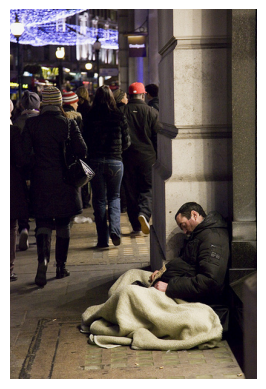

1/1 [==============================] - 1s 855ms/step
man in black shirt and black shirt is standing on the street


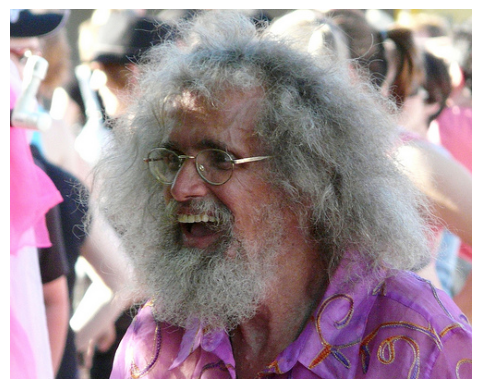

1/1 [==============================] - 1s 1s/step
two girls in colorful dresses pose for picture


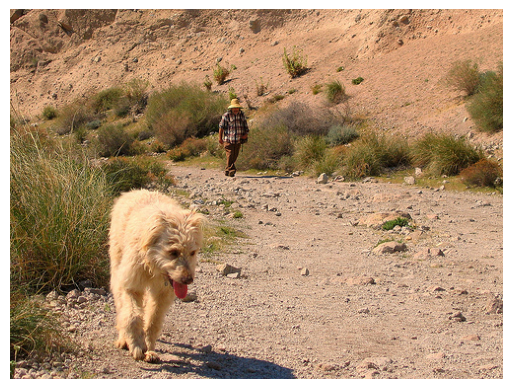

1/1 [==============================] - 1s 901ms/step
dog running in the dirt


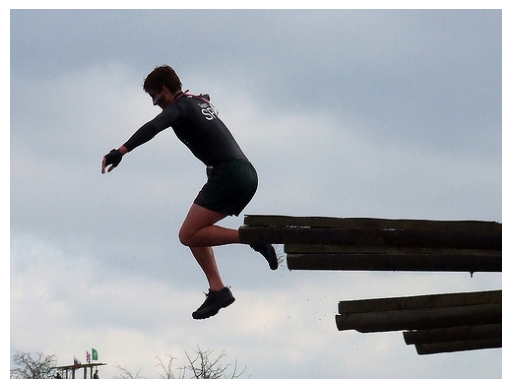

1/1 [==============================] - 1s 818ms/step
boy in blue shirt and jeans is jumping on his skateboard


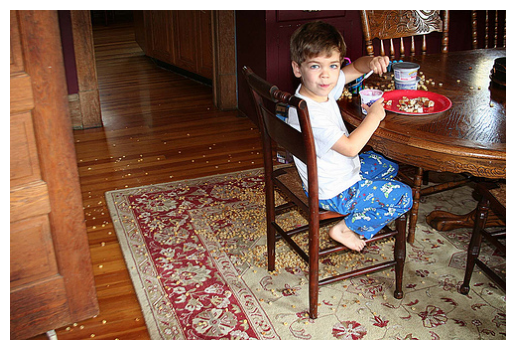

1/1 [==============================] - 1s 1s/step
little girl in pajamas is sitting on hardwood floor


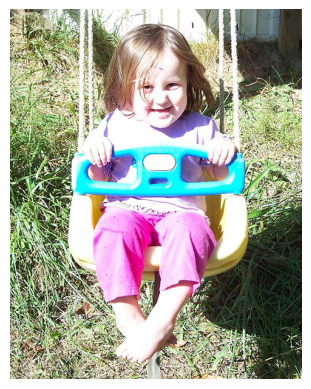

1/1 [==============================] - 1s 806ms/step
little girl in green shirt and blue shirt is smiling


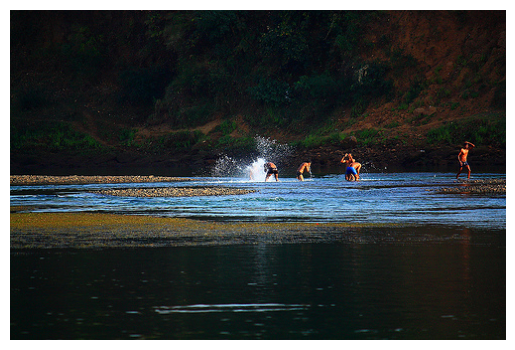

1/1 [==============================] - 1s 1s/step
man is in the water


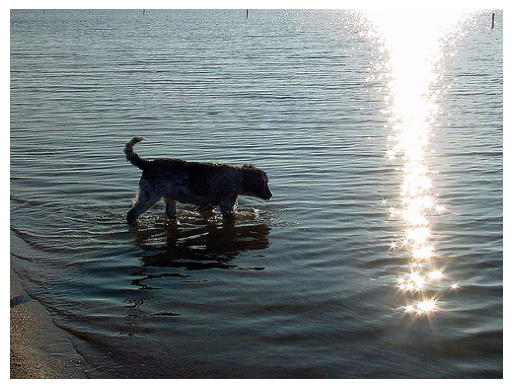

1/1 [==============================] - 1s 1s/step
dog is jumping into the water


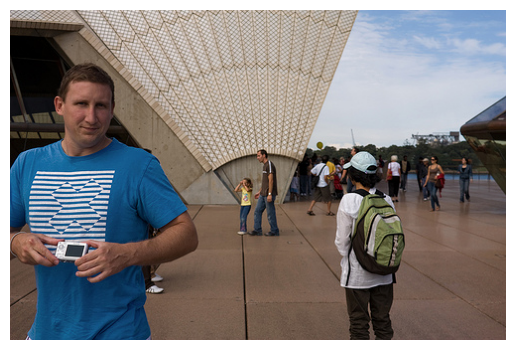

1/1 [==============================] - 2s 2s/step
man with his arm around his head and holding camera


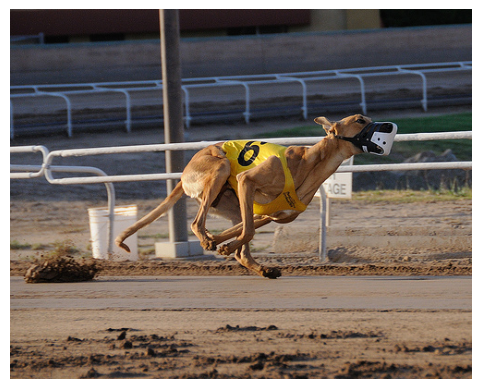

1/1 [==============================] - 1s 1s/step
greyhound dog running around track


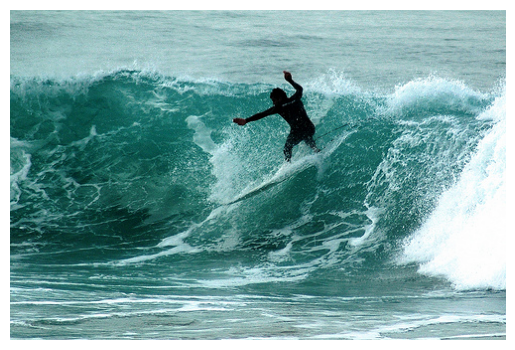

1/1 [==============================] - 1s 1s/step
surfer rides wave


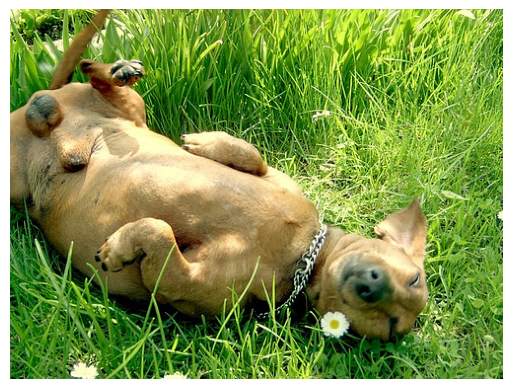

1/1 [==============================] - 1s 1s/step
two dogs are playing with each other in the grass


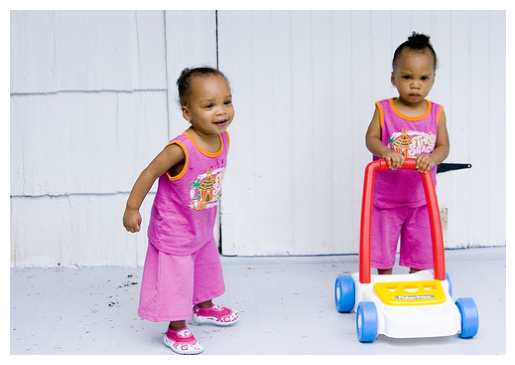

1/1 [==============================] - 1s 963ms/step
two girls in dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses dresses


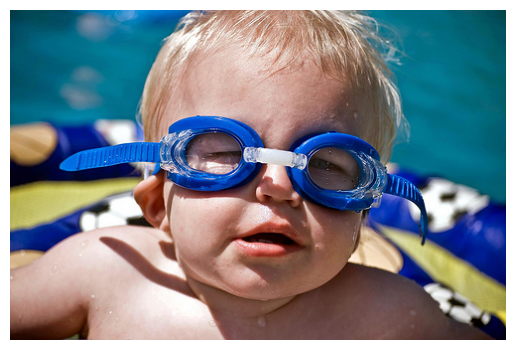

1/1 [==============================] - 1s 915ms/step
swimmer in black swimsuit is wearing goggles


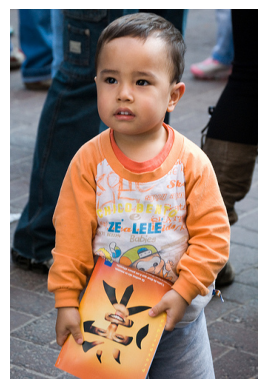

1/1 [==============================] - 1s 574ms/step
little boy in red shirt is holding onto child face


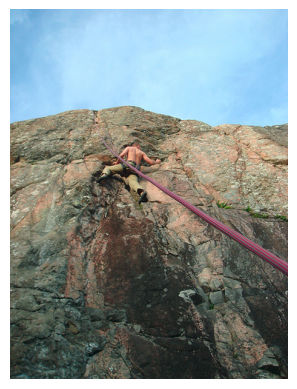

1/1 [==============================] - 1s 581ms/step
man climbing rock face


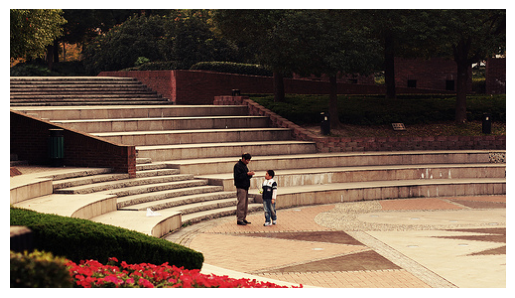

1/1 [==============================] - 1s 520ms/step
man in black shirt and jeans is walking on the sidewalk


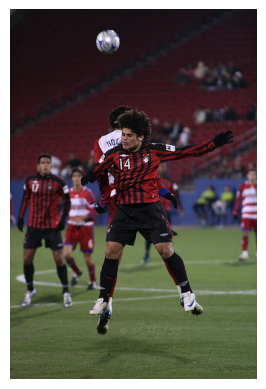

1/1 [==============================] - 1s 923ms/step
two men in football game


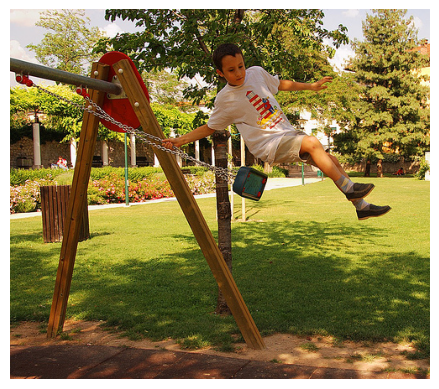

1/1 [==============================] - 1s 624ms/step
boy in red shirt and blue shorts is jumping on swing


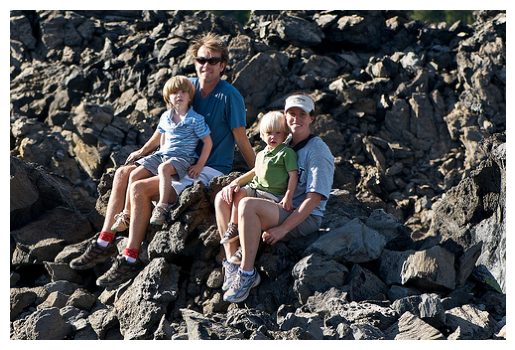

1/1 [==============================] - 1s 680ms/step
two men shovel up from the tops of the water


In [230]:
for i in range(20):
    rn =  np.random.randint(0, 1000)
    img_name = list(encoding_test.keys())[rn]
    photo = encoding_test[img_name].reshape((1,2048))

    i = plt.imread(img_path+img_name+".jpg")
    plt.imshow(i)
    plt.axis("off")
    plt.show()

    caption = predict_caption(photo)
    
    print(caption)

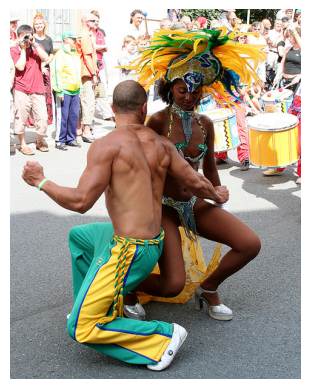

1/1 [==============================] - 1s 687ms/step
two girls in red and white dresses are playing with fireworks


In [231]:
img_name = list(encoding_test.keys())[2]
photo = encoding_test[img_name].reshape((1,2048))

i = plt.imread(img_path+img_name+".jpg")
plt.imshow(i)    
plt.axis("off")
plt.show()

caption = predict_caption(photo)
   
print(caption)

In [234]:
import nltk
BLEUscore = nltk.translate.bleu_score.sentence_bleu([reference], hypothesis)
print(BLEUscore)

0.34140798967469593


In [235]:
for i in range(5):
    reference=descriptions[img_name][i] 
    hypothesis=caption
    BLEUscore += nltk.translate.bleu_score.sentence_bleu([reference], hypothesis)
print(BLEUscore/5)

0.3113950057850319


In [236]:
reference2=reference.split()
print(reference2)

['two', 'people', 'are', 'dancing', 'with', 'drums', 'on', 'the', 'right', 'and', 'crowd', 'behind', 'them']


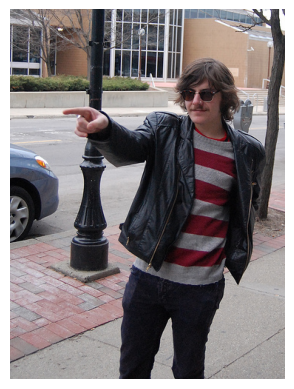

1/1 [==============================] - 1s 987ms/step
Cumulative 1-gram:0.462
Cumulative 2-gram:0.277
man in leather jacket and striped shirt points at something off camera
man in blue shirt and jeans is standing in front of some store


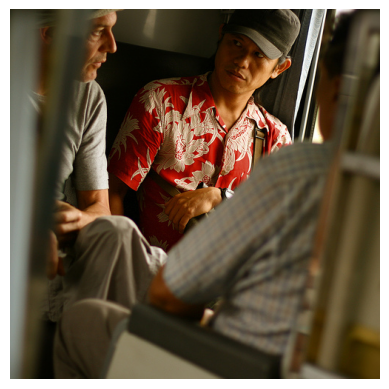

1/1 [==============================] - 1s 741ms/step
Cumulative 1-gram:0.427
Cumulative 2-gram:0.363
man with red shirt and black hat stares at another man
man in red shirt and tie is standing in front of an arcade


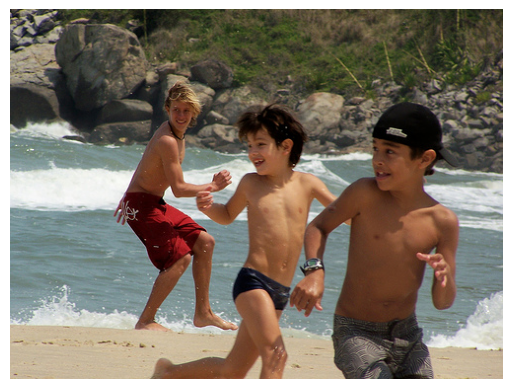

1/1 [==============================] - 1s 808ms/step
Cumulative 1-gram:0.333
Cumulative 2-gram:0.000
children playing at the beach
girl in bathing suit is jumping in the air


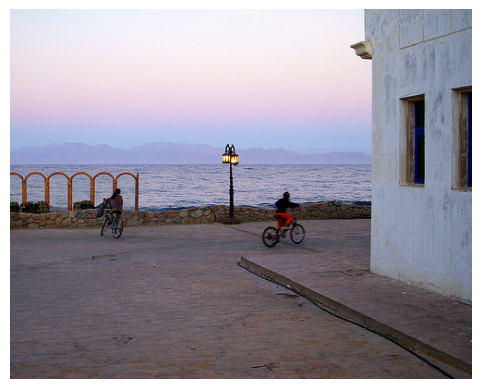

1/1 [==============================] - 2s 2s/step
Cumulative 1-gram:0.333
Cumulative 2-gram:0.204
two bicycle riders in twilight on the shore
man in blue shirt is standing on the beach


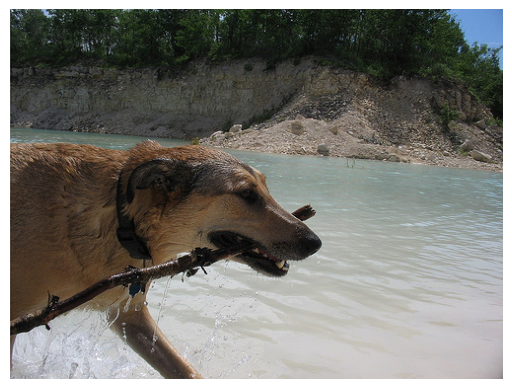

1/1 [==============================] - 1s 1s/step
Cumulative 1-gram:0.167
Cumulative 2-gram:0.000
dog carrying stick while walking in water
dog is running on the beach


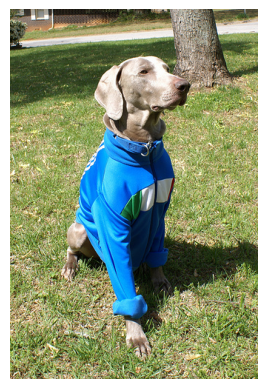

1/1 [==============================] - 1s 1s/step
Cumulative 1-gram:0.273
Cumulative 2-gram:0.165
brown dog is sitting on the grass wearing blue sports jacket
man in blue shirt and black cap is playing with ball


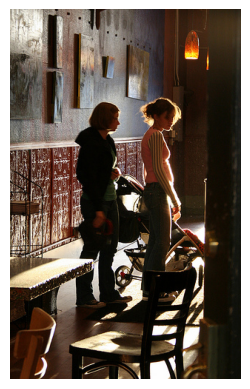

1/1 [==============================] - 1s 1s/step
Cumulative 1-gram:0.286
Cumulative 2-gram:0.000
two ladies next to stroller inside building
man and woman sit on bench outside


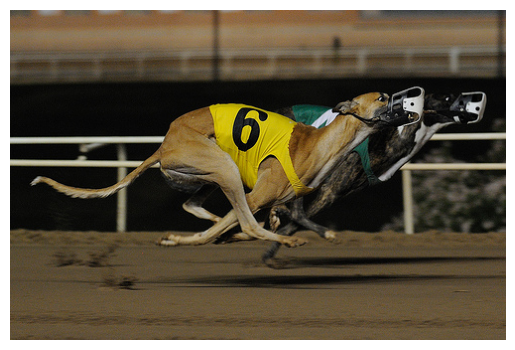

1/1 [==============================] - 2s 2s/step
Cumulative 1-gram:1.000
Cumulative 2-gram:0.632
brown number six race dog is slightly behind black race dog on track
greyhound dog is racing on track


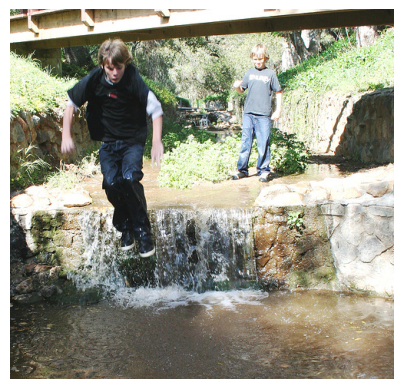

1/1 [==============================] - 2s 2s/step
Cumulative 1-gram:0.182
Cumulative 2-gram:0.000
boy jumps into water fully clothed
man in jeans and jeans is standing on rock overlooking forest


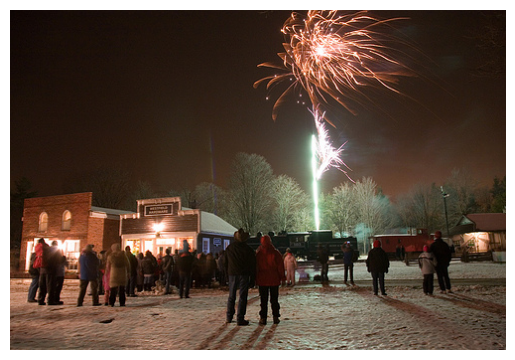

1/1 [==============================] - 1s 1s/step
Cumulative 1-gram:0.500
Cumulative 2-gram:0.447
group of people are watching fireworks outside
group of people sitting around campfire


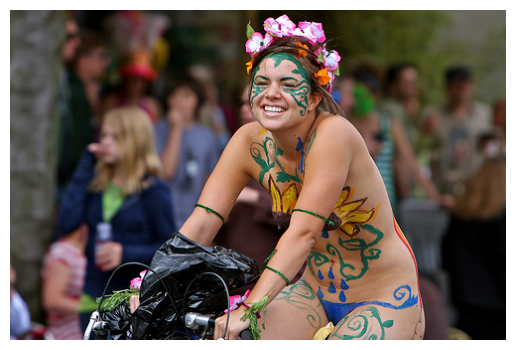

1/1 [==============================] - 1s 970ms/step
Cumulative 1-gram:0.000
Cumulative 2-gram:0.000
naked cyclist in body paint rides at fair
man with long hair and black hair and black scarf is holding camera


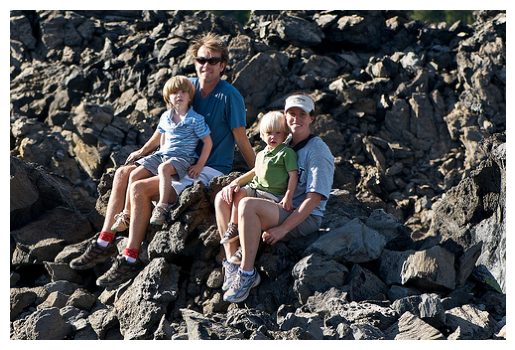

1/1 [==============================] - 1s 889ms/step
Cumulative 1-gram:0.400
Cumulative 2-gram:0.000
family sitting on rocks posing for the camera
two men shovel up from the tops of the water


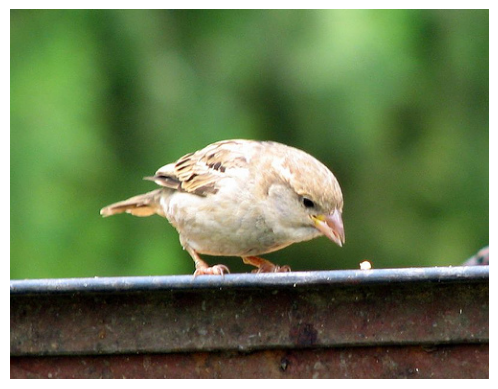

1/1 [==============================] - 1s 872ms/step
Cumulative 1-gram:0.273
Cumulative 2-gram:0.000
bird eating
the little girl is sitting on the edge of the pool


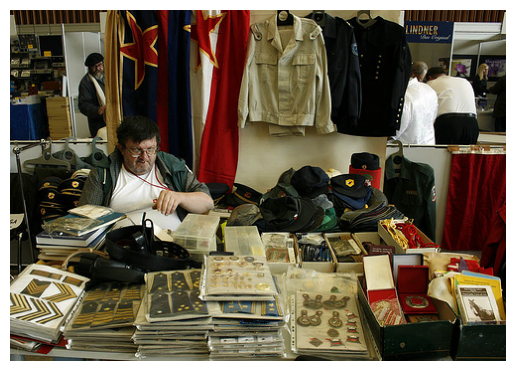

1/1 [==============================] - 1s 980ms/step
Cumulative 1-gram:0.282
Cumulative 2-gram:0.000
large man sits in military accessories store
group of people sit in line


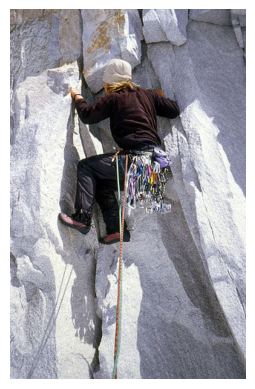

1/1 [==============================] - 1s 949ms/step
Cumulative 1-gram:0.222
Cumulative 2-gram:0.000
girl is climbing rock wall
man in red shirt is standing on concrete wall


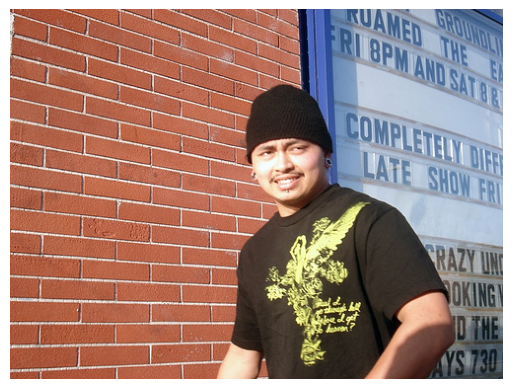

1/1 [==============================] - 1s 783ms/step
Cumulative 1-gram:0.200
Cumulative 2-gram:0.120
man in black hat standing in front of brick wall and sign
man in leather jacket and leather jacket and leather jacket and leather jacket and leather


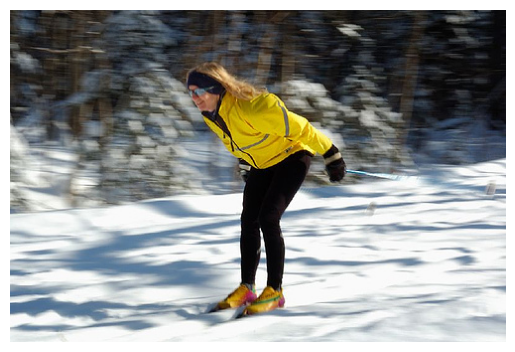

1/1 [==============================] - 1s 831ms/step
Cumulative 1-gram:0.500
Cumulative 2-gram:0.236
woman in yellow and black outfit is skiing
child in red jacket and helmet is running through snow


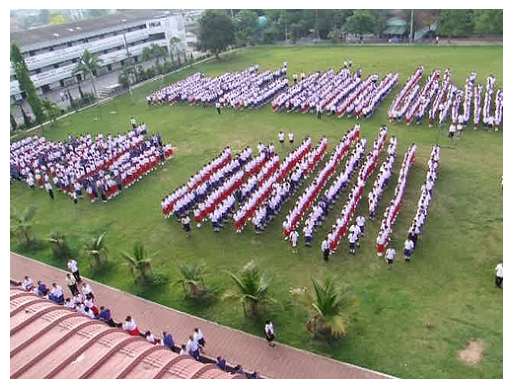

1/1 [==============================] - 1s 792ms/step
Cumulative 1-gram:0.445
Cumulative 2-gram:0.365
formation on big field with people wearing red white and blue
group of people are riding horses on the grass


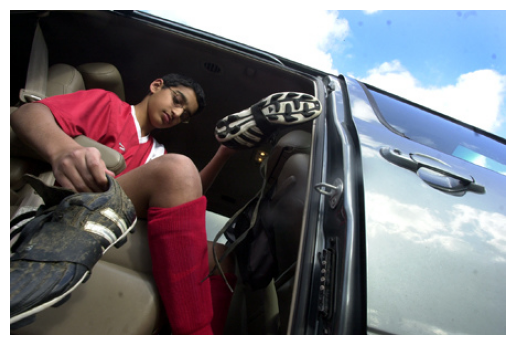

1/1 [==============================] - 1s 739ms/step
Cumulative 1-gram:0.455
Cumulative 2-gram:0.000
boy dressed in soccer attire and holding his shoes getting out of car
man in black shirt and black cap is sitting in chair


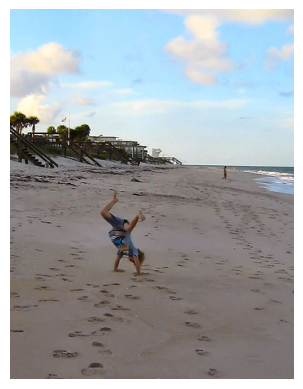

1/1 [==============================] - 1s 749ms/step
Cumulative 1-gram:0.429
Cumulative 2-gram:0.267
boy doing handstand on the beach
the man is walking in the sand


In [238]:
for i in range(20):
    rn =  np.random.randint(0, 1000)
    img_name = list(encoding_test.keys())[rn]
    photo = encoding_test[img_name].reshape((1,2048))

    i = plt.imread(img_path+img_name+".jpg")
    plt.imshow(i)
    plt.axis("off")
    plt.show()

    caption = predict_caption(photo)
    
#     for i in range(5):
    BLEUscore=0
    reference1=descriptions[img_name][0].split()
    reference2=descriptions[img_name][1].split() 
    reference3=descriptions[img_name][2].split() 
    reference4=descriptions[img_name][3].split() 
    reference5=descriptions[img_name][4].split() 
    hypothesis=caption.split()
    BLEUscore1 = nltk.translate.bleu_score.corpus_bleu([[reference1,reference2,reference3,reference4,reference5]], [hypothesis], weights=(1, 0, 0, 0))
    BLEUscore2 = nltk.translate.bleu_score.corpus_bleu([[reference1,reference2,reference3,reference4,reference5]], [hypothesis], weights=(0.5, 0.5, 0, 0))
    BLEUscore3 = nltk.translate.bleu_score.corpus_bleu([[reference1,reference2,reference3,reference4,reference5]], [hypothesis], weights=(0.33, 0.33, 0.33, 0))
    BLEUscore4 = nltk.translate.bleu_score.corpus_bleu([[reference1,reference2,reference3,reference4,reference5]], [hypothesis], weights=(0.25, 0.25, 0.25, 0.25))
    
    print("Cumulative 1-gram:%.3f"%BLEUscore1)
    print("Cumulative 2-gram:%.3f"%(BLEUscore2))
    print(descriptions[img_name][0])
    print(caption)